In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 

## Dataset loading

In [2]:
dataset = pd.read_csv('Customer_Churn_Modelling.csv')
dataset.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


## Data Visualization

In [3]:
X = dataset.iloc[:,3:-1]
Y = dataset['Exited']


<Axes: xlabel='Exited', ylabel='count'>

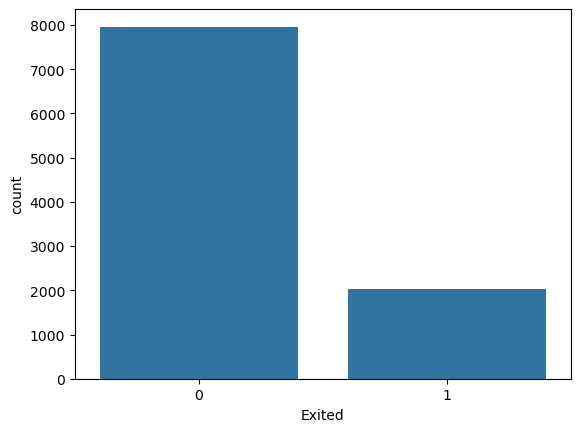

In [4]:
sns.countplot(x=Y)

In [5]:
X.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary'],
      dtype='object')

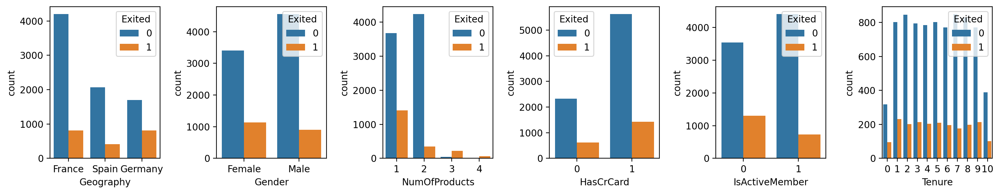

In [6]:
plt.rcParams['figure.figsize'] = (15,3)
plt.rcParams['figure.dpi'] = 200

fig,ax = plt.subplots(1,6)
sns.countplot(x= 'Geography', data=X, ax=ax[0] , hue=Y)
sns.countplot(x= 'Gender', data=X, ax=ax[1] , hue=Y)
sns.countplot(x= 'NumOfProducts', data=X, ax=ax[2] , hue=Y)
sns.countplot(x= 'HasCrCard', data=X, ax=ax[3] , hue=Y)
sns.countplot(x= 'IsActiveMember', data=X, ax=ax[4] , hue=Y)
sns.countplot(x= 'Tenure', data=X, ax=ax[5] , hue=Y)

plt.tight_layout()

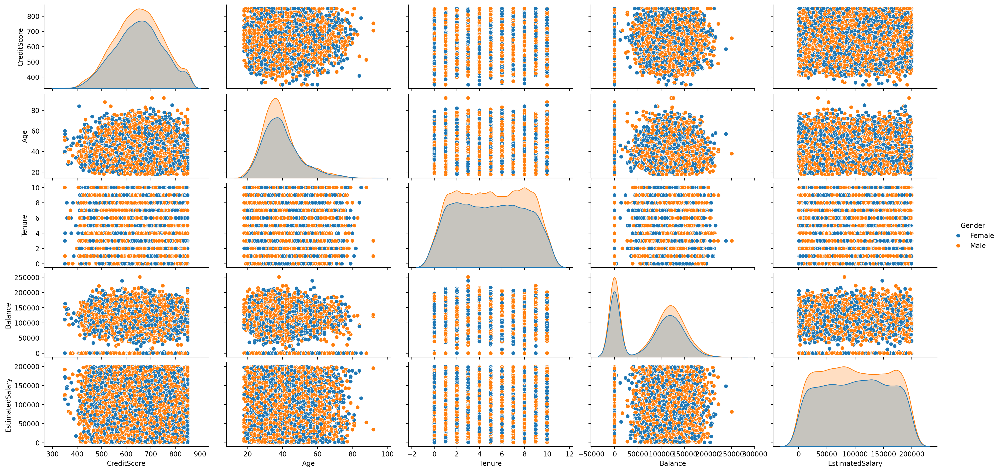

In [7]:
sns.pairplot(dataset,vars=['CreditScore', 'Age', 'Tenure', 'Balance','EstimatedSalary'], height=2, aspect=2, hue='Gender')

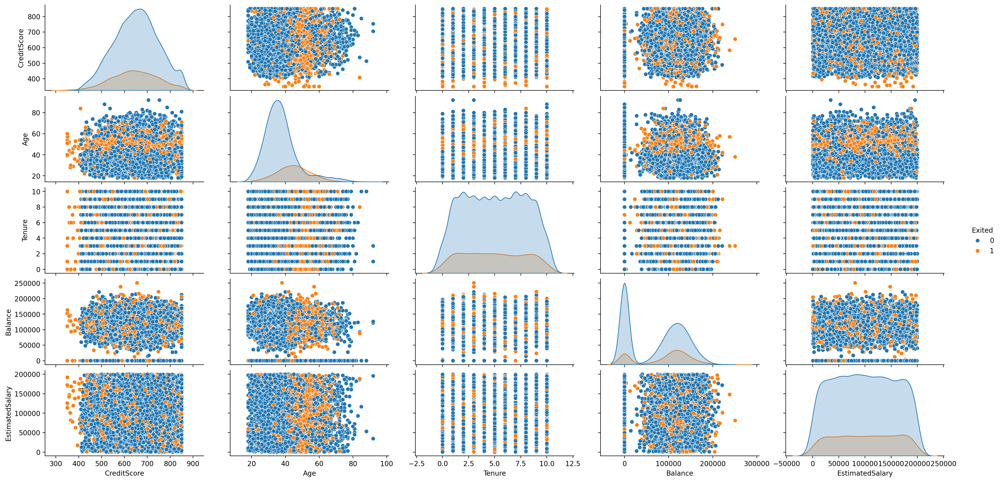

In [8]:
sns.pairplot(dataset,vars=['CreditScore', 'Age', 'Tenure', 'Balance','EstimatedSalary'], height=2, aspect=2, hue='Exited')

## Data Preprocessing

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [10]:
x_onehot = pd.get_dummies(X, drop_first=True)

In [11]:
x_train,x_test,y_train,y_test = train_test_split(x_onehot,Y,test_size=0.2,random_state=42,stratify=Y)

In [12]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [13]:
# !pip install tensorflow

## Build Neural Network Model

In [14]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, InputLayer , Dropout

from tensorflow.keras.optimizers import Adam
from sklearn.utils import class_weight

## Input Shape And Class Weights

In [15]:
input_shape = x_train.shape[1:]
input_shape

(11,)

In [16]:
model = Sequential()
model.add(InputLayer(input_shape))
model.add(Dense(128, activation='relu'),Dropout(0.3))
model.add(Dense(128, activation='relu'),Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

In [17]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         1,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,177 (71.00 KB)

 Trainable params: 18,177 (71.00 KB)

 Non-trainable params: 0 (0.00 B)

In [18]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy',metrics=['accuracy'])

In [19]:
class_weights_array = class_weight.compute_class_weight(class_weight='balanced',classes=np.unique(y_train),y=y_train)

In [20]:
class_weight_dict = {0: class_weights_array[0], 1: class_weights_array[1]}

## Model Training

In [21]:
model_history = model.fit(x_train,y_train,batch_size=32,epochs=15,class_weight=class_weight_dict, validation_split=0.1)

Epoch 1/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - accuracy: 0.6833 - loss: 0.5961 - val_accuracy: 0.7325 - val_loss: 0.5096
Epoch 2/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - accuracy: 0.7480 - loss: 0.4954 - val_accuracy: 0.7175 - val_loss: 0.5422
Epoch 3/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - accuracy: 0.7710 - loss: 0.4762 - val_accuracy: 0.7912 - val_loss: 0.4280
Epoch 4/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - accuracy: 0.7857 - loss: 0.4567 - val_accuracy: 0.7700 - val_loss: 0.4566
Epoch 5/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 549us/step - accuracy: 0.8043 - loss: 0.4312 - val_accuracy: 0.7450 - val_loss: 0.4874
Epoch 6/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 552us/step - accuracy: 0.7859 - loss: 0.4498 - val_accuracy: 0.7937 - val_loss: 0.4304
Epoch 7/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step - accuracy: 0.8053 - loss: 0.4344 - val_accuracy: 0.7700 - val_loss: 0.4464
Epoch 8/15
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 551us/step - accuracy: 0.7940 - loss: 0.4357 - 

<Axes: >

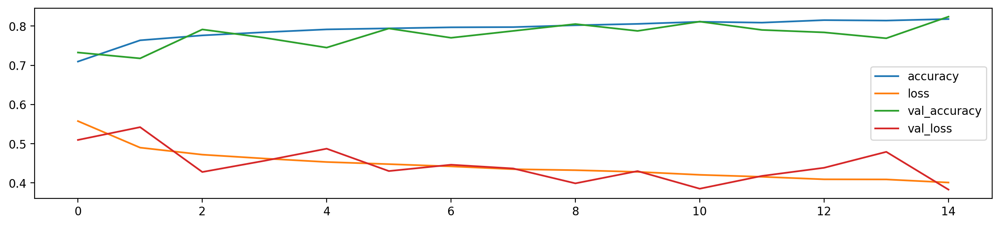

In [22]:
hist = pd.DataFrame(model_history.history)
hist.plot()

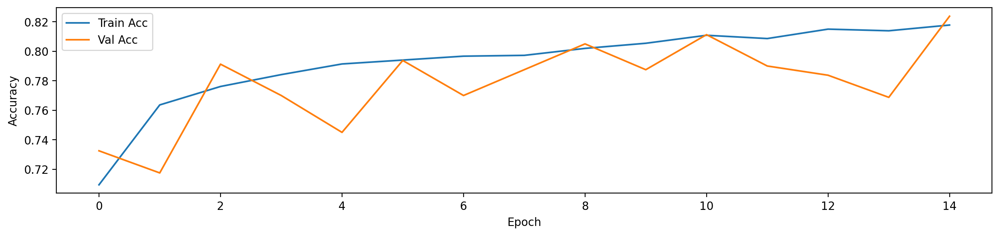

In [23]:
plt.plot(model_history.history['accuracy'], label='Train Acc')
plt.plot(model_history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Model Evaluattion 

In [24]:
from sklearn.metrics import classification_report

In [25]:
y_pred = model.predict(x_test)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


In [26]:
y_pred = (y_pred>0.5).astype(int)

In [27]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.85      0.88      1593
           1       0.55      0.70      0.61       407

    accuracy                           0.82      2000
   macro avg       0.73      0.77      0.75      2000
weighted avg       0.84      0.82      0.83      2000



## Save and Load Model

In [28]:
import pickle
import os

In [29]:
os.makedirs('model',exist_ok=True)

In [30]:
model.save('model/churn_model.keras')

In [31]:
pickle.dump(scaler,open('model/scaler.pk1','wb'))

In [32]:
model1 = keras.models.load_model('model/churn_model.keras')
scaler1 = pickle.load(open('model/scaler.pk1', 'rb'))

## Prediction on Real-life Data

In [33]:
print(scaler1.feature_names_in_)

['CreditScore' 'Age' 'Tenure' 'Balance' 'NumOfProducts' 'HasCrCard'
 'IsActiveMember' 'EstimatedSalary' 'Geography_Germany' 'Geography_Spain'
 'Gender_Male']


In [34]:
test_array = [[600, 32, 2, 0, 1, 1, 1., 101348.88, False, False, True]]
columns = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
 'IsActiveMember', 'EstimatedSalary', 'Geography_Germany', 'Geography_Spain',
 'Gender_Male']
test_df = pd.DataFrame(test_array, columns=columns)
test_scaled = scaler1.transform(test_df)

# test = scaler1.transform(test_array)

In [35]:
model1.predict(test_scaled)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


array([[0.23442192]], dtype=float32)